In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import torch
import gc
from IPython.display import display

ds_name = 'markov_32feat_11t5g_less_balanced'
ds_df_dir = '/home/yc366/repos/survsurf_benchmark/dataset_split'
proj_name = 'SurvSurfBenchmark_Markov_imbalanced'
g_resol = 1
split='test'

In [2]:
DEVICE = 'cpu'
if DEVICE == 'gpu':
    assert torch.cuda.is_available()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
else:
    device = 'cpu'

# Import and instantiate model

In [3]:
from dataset_11t5g_markov import DataModuleMarkovSurvSurf, DatasetMarkovSurvSurf

In [4]:
ds = DatasetMarkovSurvSurf(
    df_dir=ds_df_dir, 
    ds_name=ds_name, 
    g_resol=g_resol, 
    split=split, 
    mode='first_cross_obs_only', 
    separate_g_from_feats=False,
)
df_obs = ds._get_df_Xy_trans_obs()
df_true_prob = ds._get_df_Xy_true_prob()
df_true_prob.loc[
    df_true_prob[ds.colname_g] == 6,:
]

,subject,g_max_by_time,duration,event_observed,feat00,feat01,feat02,feat03,feat04,feat05,...,feat24,feat25,feat26,feat27,feat28,feat29,feat30,feat31,weight,is_t_trans


In [5]:
import xgboost as xgb
import pickle

def pred_from_xgboost_mono(run_id, proj_name, split='val'):
    if 'more_g' in run_id:
        path_trees = f'./xgboost_models/{proj_name}/more_g/{run_id}_trees.ubj'
        path_cph = f'./xgboost_models/{proj_name}/more_g/{run_id}_cph.pkl'
    else:
        path_trees = f'./xgboost_models/{proj_name}/{run_id}_trees.ubj'
        path_cph = f'./xgboost_models/{proj_name}/{run_id}_cph.pkl'

    ds = DatasetMarkovSurvSurf(
        df_dir=ds_df_dir, 
        ds_name=ds_name, 
        g_resol=g_resol, 
        split=split, 
        mode='first_cross_obs_only', 
        separate_g_from_feats=False,
    )

    df_obs = ds._get_df_Xy_trans_obs()
    input_var_selector = df_obs.columns.str.startswith('feat')|df_obs.columns.str.startswith('g_max_by_time')
    cols_inputs_obs = df_obs.columns[input_var_selector]
    df_true_prob = ds._get_df_Xy_true_prob()
    input_var_selector = df_true_prob.columns.str.startswith('feat')|df_true_prob.columns.str.startswith('g_max_by_time')
    cols_inputs_true_probs = df_true_prob.columns[input_var_selector]
    assert all(cols_inputs_obs == cols_inputs_true_probs)

    with open(path_cph, 'rb') as fp:
        cph=pickle.load(fp)
    xgboost_model = xgb.Booster()
    xgboost_model.load_model(path_trees)

    def pred_from_df(x):
        x_dmatrix = xgb.DMatrix(x)
        tree_results = pd.DataFrame({
            'xgb_risk': np.log(xgboost_model.predict(x_dmatrix)),
        })
        S = cph.predict_survival_function(tree_results).T
        return S

    assert (
        df_true_prob.groupby(['subject',ds.colname_g]).apply(
            lambda x: tuple(x['duration']),
            include_groups=False
        )
    ).nunique() == 1


    df_val_results_obs = []
    df_val_results_grid = []
    for g, df_obs_g in df_obs.groupby(ds.colname_g):
        if g > 5:
            continue
        df_true_prob_g = df_true_prob.loc[
            df_true_prob[ds.colname_g] == g,:
        ]

        n_unique_time_per_subj = (
            df_true_prob_g.groupby(['subject']).apply(
                lambda x: tuple(x['duration'].sort_values()),
                include_groups=False
            )
        ).nunique()
        assert n_unique_time_per_subj == 1, n_unique_time_per_subj
        x = df_obs_g[cols_inputs_obs].astype('float32')
        x['g_max_by_time'] = x['g_max_by_time']/ds.g_max
        curvs = pred_from_df(x)            
        
        for subj, (_, curv) in zip(df_obs_g['subject'], curvs.iterrows()):
            obs_g_subj = df_obs_g.loc[df_obs_g['subject'] == subj,:]
            assert obs_g_subj.shape[0] == 1
            obs_g_subj = obs_g_subj.iloc[0,:]
            t = obs_g_subj['duration']
            truth = obs_g_subj['event_observed']
            if t > curv.index.max():
                pred = curv.iloc[-1]
            else:
                pred = np.interp(t, xp=curv.index, fp=curv.values)
            row = {
                'subj':subj,
                'g':g,
                't':t,
                'pred':1-pred,
                'truth':truth
            }
            df_val_results_obs.append(row)

        
    for g, df_true_prob_g in df_true_prob.groupby(ds.colname_g):   
        df_true_prob_g_tless = df_true_prob_g.drop(columns=['duration','event_observed']).drop_duplicates()
        assert df_true_prob_g_tless['subject'].value_counts().max() == 1
        x = df_true_prob_g_tless[cols_inputs_obs].astype('float32')
        x['g_max_by_time'] = x['g_max_by_time']/ds.g_max
        curvs = pred_from_df(x)     

        for subj, (_, curv) in zip(df_true_prob_g_tless['subject'], curvs.iterrows()):
            df_val_subj_g = pd.DataFrame()
            df_true_prob_subj_g = df_true_prob_g.loc[
                df_true_prob_g['subject'] == subj,:
            ].sort_values('duration')
            t_grid = df_true_prob_subj_g['duration']
            t_grid_in_range = t_grid[t_grid <= curv.index.max()]
            t_grid_extrap = t_grid[t_grid > curv.index.max()]
            pred_prob_at_time_grid = np.interp(t_grid_in_range, xp=curv.index, fp=curv.values)
            pred_prob_at_time_grid = np.r_[pred_prob_at_time_grid, [pred_prob_at_time_grid[-1]]*t_grid_extrap.size]

            df_val_subj_g['t'] = t_grid
            df_val_subj_g['subj'] = subj
            df_val_subj_g['g'] = g
            df_val_subj_g['pred'] = 1-pred_prob_at_time_grid
            df_val_subj_g['truth'] = df_true_prob_subj_g['event_observed']
            df_val_results_grid.append(df_val_subj_g)
    out_dfs = dict()
    out_dfs['obs'] = pd.DataFrame(df_val_results_obs)
    out_dfs['true_prob'] = pd.concat(df_val_results_grid)
    return out_dfs, 'xgboost_mono'

In [6]:
import torchtuples as tt
from pycox.models.cox_time import MLPVanillaCoxTime
from pycox.models import CoxTime

def pred_from_pycox_coxtime(run_id, proj_name, split='val'):
    if 'more_g' in run_id:
        path = f'./pycox_models/more_g/{proj_name}/{run_id}'
    else:
        path = f'./pycox_models/{proj_name}/{run_id}'

    ds = DatasetMarkovSurvSurf(
        df_dir=ds_df_dir, 
        ds_name=ds_name, 
        g_resol=g_resol, 
        split=split, 
        mode='first_cross_obs_only', 
        separate_g_from_feats=False,
    )

    df_obs = ds._get_df_Xy_trans_obs()
    input_var_selector = df_obs.columns.str.startswith('feat')|df_obs.columns.str.startswith('g_max_by_time')
    cols_inputs_obs = df_obs.columns[input_var_selector]
    df_true_prob = ds._get_df_Xy_true_prob()
    input_var_selector = df_true_prob.columns.str.startswith('feat')|df_true_prob.columns.str.startswith('g_max_by_time')
    cols_inputs_true_probs = df_true_prob.columns[input_var_selector]
    assert all(cols_inputs_obs == cols_inputs_true_probs)

    in_features = len(cols_inputs_obs)
    num_nodes = [32, 32, 32, 32]
    batch_norm = False

    net = MLPVanillaCoxTime(in_features, num_nodes, batch_norm)
    model = CoxTime(net)
    model.load_net(path=path)
    assert (
        df_true_prob.groupby(['subject',ds.colname_g]).apply(
            lambda x: tuple(x['duration']),
            include_groups=False
        )
    ).nunique() == 1


    df_val_results_obs = []
    df_val_results_grid = []
    for g, df_obs_g in df_obs.groupby(ds.colname_g):
        if g > 5:
            continue
        df_true_prob_g = df_true_prob.loc[
            df_true_prob[ds.colname_g] == g,:
        ]

        n_unique_time_per_subj = (
            df_true_prob_g.groupby(['subject']).apply(
                lambda x: tuple(x['duration'].sort_values()),
                include_groups=False
            )
        ).nunique()
        assert n_unique_time_per_subj == 1, n_unique_time_per_subj
        x = df_obs_g[cols_inputs_obs].astype('float32')
        x['g_max_by_time'] = x['g_max_by_time']/ds.g_max
        curvs = model.predict_surv_df(x.values).T            
        
        for subj, (_, curv) in zip(df_obs_g['subject'], curvs.iterrows()):
            obs_g_subj = df_obs_g.loc[df_obs_g['subject'] == subj,:]
            assert obs_g_subj.shape[0] == 1
            obs_g_subj = obs_g_subj.iloc[0,:]
            t = obs_g_subj['duration']
            truth = obs_g_subj['event_observed']
            if t > curv.index.max():
                pred = curv.iloc[-1]
            else:
                pred = np.interp(t, xp=curv.index, fp=curv.values)
            row = {
                'subj':subj,
                'g':g,
                't':t,
                'pred':1-pred,
                'truth':truth
            }
            df_val_results_obs.append(row)

        
    for g, df_true_prob_g in df_true_prob.groupby(ds.colname_g):   
        df_true_prob_g_tless = df_true_prob_g.drop(columns=['duration','event_observed']).drop_duplicates()
        assert df_true_prob_g_tless['subject'].value_counts().max() == 1
        x = df_true_prob_g_tless[cols_inputs_obs].astype('float32')
        x['g_max_by_time'] = x['g_max_by_time']/ds.g_max
        curvs = model.predict_surv_df(x.values).T    

        for subj, (_, curv) in zip(df_true_prob_g_tless['subject'], curvs.iterrows()):
            df_val_subj_g = pd.DataFrame()
            df_true_prob_subj_g = df_true_prob_g.loc[
                df_true_prob_g['subject'] == subj,:
            ].sort_values('duration')
            t_grid = df_true_prob_subj_g['duration']
            t_grid_in_range = t_grid[t_grid <= curv.index.max()]
            t_grid_extrap = t_grid[t_grid > curv.index.max()]
            pred_prob_at_time_grid = np.interp(t_grid_in_range, xp=curv.index, fp=curv.values)
            pred_prob_at_time_grid = np.r_[pred_prob_at_time_grid, [pred_prob_at_time_grid[-1]]*t_grid_extrap.size]

            df_val_subj_g['t'] = t_grid
            df_val_subj_g['subj'] = subj
            df_val_subj_g['g'] = g
            df_val_subj_g['pred'] = 1-pred_prob_at_time_grid
            df_val_subj_g['truth'] = df_true_prob_subj_g['event_observed']
            df_val_results_grid.append(df_val_subj_g)
    out_dfs = dict()
    out_dfs['obs'] = pd.DataFrame(df_val_results_obs)
    out_dfs['true_prob'] = pd.concat(df_val_results_grid)
    return out_dfs, 'CoxTime'

In [7]:
import pickle
def pred_from_sksurv_joint(run_id, proj_name, split='val'):
    if 'more_g' in run_id:
        path_pickle = f'./sksurv_models/more_g/{proj_name}/Joint/{run_id}.pickle'
    else:
        path_pickle = f'./sksurv_models/{proj_name}/Joint/{run_id}.pickle'
    with open(path_pickle, 'rb') as f:
        model = pickle.load(f)
    

    ds = DatasetMarkovSurvSurf(
        df_dir=ds_df_dir, 
        ds_name=ds_name, 
        g_resol=g_resol, 
        split=split, 
        mode='first_cross_obs_only', 
        separate_g_from_feats=False,
    )
    df_obs = ds._get_df_Xy_trans_obs()
    df_true_prob = ds._get_df_Xy_true_prob()
    assert (
        df_true_prob.groupby(['subject',ds.colname_g]).apply(
            lambda x: tuple(x['duration']),
            include_groups=False
        )
    ).nunique() == 1


    cols_X = np.r_[[ds.colname_g], df_obs.columns[df_obs.columns.str.startswith('feat')]]      

    df_val_results_obs = []
    df_val_results_grid = []
    for g, df_obs_g in df_obs.groupby(ds.colname_g):
        if g > 5:
            continue
        df_true_prob_g = df_true_prob.loc[
            df_true_prob[ds.colname_g] == g,:
        ]

        n_unique_time_per_subj = (
            df_true_prob_g.groupby(['subject']).apply(
                lambda x: tuple(x['duration'].sort_values()),
                include_groups=False
            )
        ).nunique()
        assert n_unique_time_per_subj == 1, n_unique_time_per_subj
        curvs = model.predict_survival_function(df_obs_g[cols_X])
                
        
        for subj, curv in zip(df_obs_g['subject'], curvs):
            obs_g_subj = df_obs_g.loc[df_obs_g['subject'] == subj,:]
            assert obs_g_subj.shape[0] == 1
            obs_g_subj = obs_g_subj.iloc[0,:]
            t = obs_g_subj['duration']
            truth = obs_g_subj['event_observed']
            if t > curv.x.max():
                pred = curv(curv.x.max())
            else:
                pred = curv(t)
            row = {
                'subj':subj,
                'g':g,
                't':t,
                'pred':1-pred,
                'truth':truth
            }
            df_val_results_obs.append(row)

     
    for g, df_true_prob_g in df_true_prob.groupby(ds.colname_g):   
        df_true_prob_g_tless = df_true_prob_g.drop(columns=['duration','event_observed']).drop_duplicates()
        assert df_true_prob_g_tless['subject'].value_counts().max() == 1
        curvs = model.predict_survival_function(df_true_prob_g_tless[cols_X])

        for subj, curv in zip(df_true_prob_g_tless['subject'], curvs):
            df_val_subj_g = pd.DataFrame()
            df_true_prob_subj_g = df_true_prob_g.loc[
                df_true_prob_g['subject'] == subj,:
            ].sort_values('duration')
            t_grid = df_true_prob_subj_g['duration']
            t_grid_in_range = t_grid[t_grid <= curv.x.max()]
            t_grid_extrap = t_grid[t_grid > curv.x.max()]
            pred_prob_at_time_grid = curv(t_grid_in_range)
            pred_prob_at_time_grid = np.r_[pred_prob_at_time_grid, [pred_prob_at_time_grid[-1]]*t_grid_extrap.size]

            df_val_subj_g['t'] = t_grid
            df_val_subj_g['subj'] = subj
            df_val_subj_g['g'] = g
            df_val_subj_g['pred'] = 1-pred_prob_at_time_grid
            df_val_subj_g['truth'] = df_true_prob_subj_g['event_observed']
            df_val_results_grid.append(df_val_subj_g)

    out_dfs = dict()
    out_dfs['obs'] = pd.DataFrame(df_val_results_obs)
    out_dfs['true_prob'] = pd.concat(df_val_results_grid)
    return out_dfs, f'Joint_{model.__class__.__name__}'

In [8]:
def pred_from_DeepHit(run_id, proj_name, split='val'):
    import wandb
    from model_factory_deephit import LitModelDeepHit
    torch.set_float32_matmul_precision('medium')

    api = wandb.Api()
    # artifact = api.artifact(f'yichenchen-wings/{proj_name}/model-{run_id}:v0', type='model')
    # checkpoint_dir = artifact.download()
    checkpoint_dir = f'/home/yc366/repos/survsurf_benchmark/runtime_results/{proj_name}/{run_id}/checkpoints/'
    os.listdir(checkpoint_dir)[0]
    #path_checkpoint = os.path.join(checkpoint_dir, 'model.ckpt')
    path_checkpoint = os.path.join(checkpoint_dir, os.listdir(checkpoint_dir)[0])
    model_lit = LitModelDeepHit.load_from_checkpoint(path_checkpoint)
    
    datamodule = DataModuleMarkovSurvSurf(
        df_dir=ds_df_dir, 
        ds_name=ds_name, 
        g_resol=g_resol, 
        separate_g_from_feats=False, 
        train_mode='first_cross_obs_only',
        eval_mode='true_probs_grid',
        batch_size=100, 
        num_workers=4)
    datamodule.setup(stage=split)
    if 'val' in split:
        dataloader_obs, dataloader_true_prob = datamodule.val_dataloader()
    if 'test' in split:
        dataloader_obs, dataloader_true_prob = datamodule.test_dataloader()

    with torch.no_grad():
        torch.cuda.empty_cache()
    gc.collect()

    model_loaded_core = model_lit.model
    model_loaded_core = model_loaded_core.to(device)
    model_loaded_core.eval()

    t_size = model_lit.loss_brier.t_size
    t_res = model_lit.loss_brier.t_res

    out_dfs = dict()
    for key, dataloader in [
        ('obs', dataloader_obs),
        ('true_prob', dataloader_true_prob)
    ]:
        
        out_dfs = dict()
    for key, dataloader in [
        ('obs', dataloader_obs),
        ('true_prob', dataloader_true_prob)
    ]:
        subjs = []
        g = []
        t = []
        pred = []
        truth = []
        with torch.no_grad():
            for batch_, (subj, xs, ts, ys, weight, _) in enumerate(dataloader):
                xs, ts, ys = xs.to(device), ts.to(device), ys.to(device)
                out = model_loaded_core.forward_cif(xs)
                assert out.dim() == 3, f'found output with n dim = {out.dim()}, expecting a 3d tensor.'
                assert out.shape[1] == 1, f'found output with second dim = {out.shape[1]}, expecting 1.'
                out = out.reshape(out.shape[0], out.shape[-1])

                t_matrix = ts.repeat(1, t_size)
                
                t_matrix_ref = torch.linspace(0, t_size-1, steps=t_size)*t_res
                t_matrix_ref = t_matrix_ref.repeat(xs.shape[0], 1)

                selector_where_t = torch.logical_and(t_matrix_ref >= t_matrix,  t_matrix_ref < (t_matrix + t_res))
                assert torch.all(selector_where_t.sum(dim=-1) == 1)
                out = out[selector_where_t].reshape(xs.shape[0])

                subjs += list(subj.cpu().numpy())
                g += list(5*xs.cpu().numpy()[:,-1])
                t += list(ts.cpu().numpy()[:,0])
                truth += list(ys.cpu().numpy()[:,0])
                pred += list(out.cpu().numpy())


        pred = np.array(pred)
        truth = np.array(truth)
        df_val_results = pd.DataFrame()
        df_val_results['subj'] = subjs
        df_val_results['g'] = g
        df_val_results['t'] = t
        df_val_results['pred'] = pred
        df_val_results['truth'] = truth
        for col in ['pred', 'truth']:
            df_val_results[col] = df_val_results[col].astype(float)
        out_dfs[key] = df_val_results
    return out_dfs, model_loaded_core.__class__.__name__


In [9]:

def pred_from_SurvSurf(run_id, proj_name, split='val'):
    import wandb
    from model_factory_survsurf import LitModelSurvSurf
    torch.set_float32_matmul_precision('medium')

    api = wandb.Api()
    # artifact = api.artifact(f'yichenchen-wings/{proj_name}/model-{run_id}:v0', type='model')
    # checkpoint_dir = artifact.download()
    checkpoint_dir = f'/home/yc366/repos/survsurf_benchmark/runtime_results/{proj_name}/{run_id}/checkpoints/'
    os.listdir(checkpoint_dir)[0]
    #path_checkpoint = os.path.join(checkpoint_dir, 'model.ckpt')
    path_checkpoint = os.path.join(checkpoint_dir, os.listdir(checkpoint_dir)[0])
    model_lit = LitModelSurvSurf.load_from_checkpoint(path_checkpoint)
    
    datamodule = DataModuleMarkovSurvSurf(
        df_dir=ds_df_dir, 
        ds_name=ds_name, 
        g_resol=g_resol, 
        separate_g_from_feats=True, 
        train_mode='first_cross_obs_only',
        eval_mode='true_probs_grid',
        batch_size=100, 
        num_workers=4)
    datamodule.setup(stage=split)
    if 'val' in split:
        dataloader_obs, dataloader_true_prob = datamodule.val_dataloader()
    if 'test' in split:
        dataloader_obs, dataloader_true_prob = datamodule.test_dataloader()

    with torch.no_grad():
        torch.cuda.empty_cache()
    gc.collect()

    model_loaded_core = model_lit.model
    model_loaded_core = model_loaded_core.to(device)
    model_loaded_core.eval()


    out_dfs = dict()
    for key, dataloader in [
        ('obs', dataloader_obs),
        ('true_prob', dataloader_true_prob)
    ]:
        
        subjs = []
        g = []
        t = []
        pred = []
        truth = []
        with torch.no_grad():
            for batch_, (subj, xs, gs, ts, ys, weight, _) in enumerate(dataloader):
                xs, gs, ts, ys = xs.to(device), gs.to(device), ts.to(device), ys.to(device)
                out = model_loaded_core(ts, gs, xs)
                subjs += list(subj.cpu().numpy())
                g += list(5*gs.cpu().numpy()[:,0])
                t += list(ts.cpu().numpy()[:,0])
                truth += list(ys.cpu().numpy()[:,0])
                pred += list(out.cpu().numpy()[:,0])


        pred = np.array(pred)
        truth = np.array(truth)
        df_val_results = pd.DataFrame()
        df_val_results['subj'] = subjs
        df_val_results['g'] = g
        df_val_results['t'] = t
        df_val_results['pred'] = pred
        df_val_results['truth'] = truth
        for col in ['pred', 'truth']:
            df_val_results[col] = df_val_results[col].astype(float)
        out_dfs[key] = df_val_results
    return out_dfs, model_loaded_core.__class__.__name__


In [10]:


ds_train = DatasetMarkovSurvSurf(
    df_dir=ds_df_dir, 
    ds_name=ds_name, 
    g_resol=g_resol, 
    split='train', 
    mode='true_probs_grid', 
    separate_g_from_feats=False
)
ds_val = DatasetMarkovSurvSurf(
    df_dir=ds_df_dir, 
    ds_name=ds_name, 
    g_resol=g_resol, 
    split='val', 
    mode='true_probs_grid', 
    separate_g_from_feats=False
)
ds_test = DatasetMarkovSurvSurf(
    df_dir=ds_df_dir, 
    ds_name=ds_name, 
    g_resol=g_resol, 
    split='test', 
    mode='true_probs_grid', 
    separate_g_from_feats=False
)

In [11]:
ds_train._get_df_Xy_trans_obs()

,subject,event_observed,duration,g_max_by_time,feat00,feat01,feat02,feat03,feat04,feat05,...,feat24,feat25,feat26,feat27,feat28,feat29,feat30,feat31,weight,is_t_trans
0,0,0,8,1.0,0.883893,0.195865,0.357537,-2.343262,-1.084833,0.559696,...,-0.243339,-0.130031,-0.109017,1.556186,0.128778,-2.066949,-0.885493,0.0,1,1
1,2,1,2,1.0,1.301429,-0.994802,2.094665,0.359429,0.691002,-1.485720,...,-0.938910,-1.901464,1.095433,-0.333544,-1.441849,-1.416667,-1.629502,0.0,1,1
2,2,0,9,2.0,1.301429,-0.994802,2.094665,0.359429,0.691002,-1.485720,...,-0.938910,-1.901464,1.095433,-0.333544,-1.441849,-1.416667,-1.629502,0.0,1,1
3,4,0,10,1.0,-0.105813,2.009902,0.011231,-1.089429,-1.514511,-0.559761,...,-1.941266,0.341435,1.862855,-0.295230,0.478317,-0.715190,1.237293,1.0,1,1
4,6,1,7,1.0,0.805669,-0.012551,-0.260823,-0.889478,-1.615899,-0.851965,...,-0.708124,1.414139,-0.490533,1.181171,-0.046925,-1.460106,-0.508191,0.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,1992,1,3,1.0,1.887814,-0.916923,1.161632,-0.066051,-0.441054,-0.509703,...,0.588371,0.057385,-1.449706,1.029386,-1.083464,0.200246,-0.124959,1.0,1,1
1477,1992,0,10,2.0,1.887814,-0.916923,1.161632,-0.066051,-0.441054,-0.509703,...,0.588371,0.057385,-1.449706,1.029386,-1.083464,0.200246,-0.124959,1.0,1,1
1478,1994,0,9,1.0,-0.988847,-0.649444,1.478383,0.070699,-0.789017,-2.257556,...,-1.521026,-0.080296,0.512007,0.947581,2.601291,0.799184,-1.621785,0.0,1,1
1479,1996,0,10,1.0,0.152894,1.238644,1.031289,-0.892269,0.576628,-0.504123,...,-2.568419,-0.777317,-1.153698,0.216245,2.581702,0.022548,0.849395,0.0,1,1


### Define scoring functions

In [12]:
from model_eval_utils import (
    get_brier_and_auc, 
    get_all_grades_start_end_time, 
    get_integrated_brier_intrvl_imputed, 
    get_mse_vs_theory,
    get_mae_vs_theory,
    get_mse_vs_theory_certain_obs
)

/tmp/ipykernel_17871/3729918870.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df_max_g_by_t_obs.groupby('subject').apply(lambda df: _get_last_obs_time(df, g))
/tmp/ipykernel_17871/3729918870.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df_max_g_by_t_obs.groupby('subject').apply(lambda df: _get_last_obs_time(df, g))


min censoring S(t) for g = 0.0
min censoring S(t) for g = 0.0
min censoring S(t) for g = 0.0
min censoring S(t) for g = 0.0
min censoring S(t) for g = 0.0


/tmp/ipykernel_17871/3729918870.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df_max_g_by_t_obs.groupby('subject').apply(lambda df: _get_last_obs_time(df, g))
/tmp/ipykernel_17871/3729918870.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df_max_g_by_t_obs.groupby('subject').apply(lambda df: _get_last_obs_time(df, g))
/tmp/ipykernel_17871/3729918870.py:9: DeprecationWarning: DataFrameGro

[Text(0, 0.5, 'S(t) for censoring'), Text(0.5, 0, 't')]

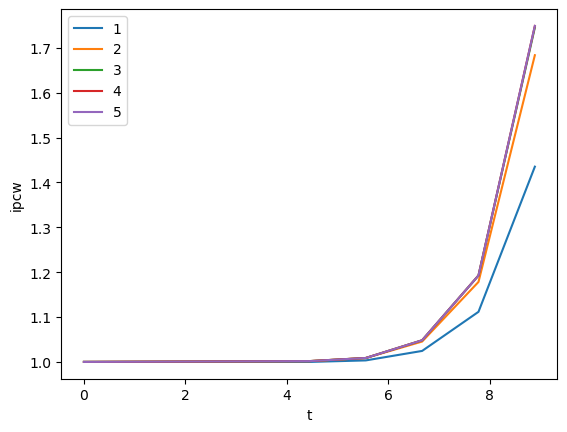

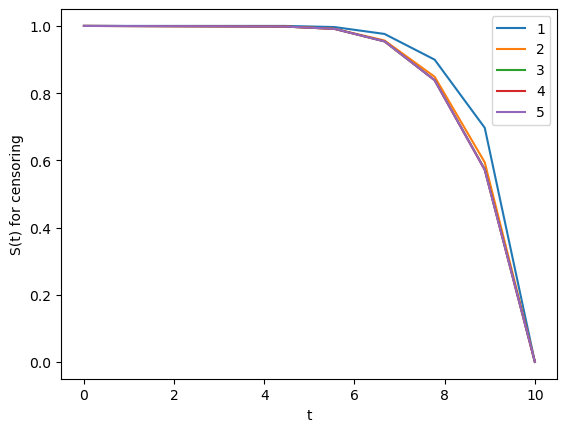

In [13]:
from sksurv.nonparametric import kaplan_meier_estimator
from model_eval_utils import _get_last_obs_time

def get_pre_censoring_t(df_dir, ds_name, gs, split):
    path_max_g_by_t_obs = os.path.join(df_dir,f'{ds_name}__df_state_history_sampled_max_{split}.csv')
    df_max_g_by_t_obs = pd.read_csv(path_max_g_by_t_obs, index_col=0)
    df_out = []
    for g in gs:
        df = df_max_g_by_t_obs.groupby('subject').apply(lambda df: _get_last_obs_time(df, g))
        df_out.append(df)
    df_out = pd.concat(df_out)
    return df_out
class IPCW:
    def __init__(self, time, S_censor):
        self.time = time
        self.S_censor = S_censor
    def __call__(self,t):
        S_censor = self.S_censor
        # percentile  = np.percentile(S_censor, 10)
        # S_censor[S_censor <= percentile] = percentile
        S = np.interp(t, self.time, S_censor)
        return 1/S

def get_train_ipcw(df_event_g_at_t_obs):
    df_event_g_at_t_obs = df_event_g_at_t_obs
    g_to_censor_curv = dict()
    for g, df_event_t in df_event_g_at_t_obs.groupby('g'):
        df_event_t = df_event_t.sort_values('duration')
        time, S_censor = kaplan_meier_estimator(df_event_t['event_observed'].astype(bool), df_event_t['duration'], reverse=True)
        if 0 not in time:
            time = np.r_[[0.], time]
            S_censor = np.r_[[1.], S_censor]
        g_to_censor_curv[g] = IPCW(time, S_censor)
    return g_to_censor_curv

df_last_obs_time_split = get_pre_censoring_t(df_dir=ds_df_dir,ds_name=ds_name, gs=[1,2,3,4,5], split='val')
df_last_obs_time_split = df_last_obs_time_split.loc[df_last_obs_time_split['g'] <6, :]
df_train_obs_censor_less = df_last_obs_time_split.copy()
df_train_obs_censor_less['event_observed'] = True
df_train_obs_censor_less['duration'] = df_train_obs_censor_less['duration'].astype(float)
dict_ipcw = get_train_ipcw(df_last_obs_time_split)

fig, ax = plt.subplots(1,1,)
for g in [1,2,3,4,5]:
    x = np.linspace(0, 10,10)
    y = dict_ipcw[g](x)
    ax.plot(x, y, label=g),
ax.legend()
ax.set(ylabel='ipcw', xlabel='t')


fig, ax = plt.subplots(1,1,)
for g in [1,2,3,4,5]:
    x = np.linspace(0, 10,10)
    y = 1/dict_ipcw[g](x)
    print(f'min censoring S(t) for g = {y.min()}')
    ax.plot(x, y, label=g),
ax.legend()
ax.set(ylabel='S(t) for censoring', xlabel='t')

In [14]:
df_last_obs_time_split.loc[df_last_obs_time_split['event_observed']==1, 'duration'].describe()

count    249.000000
mean       9.289157
std        0.990236
min        5.000000
25%        9.000000
50%       10.000000
75%       10.000000
max       10.000000
Name: duration, dtype: float64

### Make predictions

Text(0.5, 0, 'time $t$')

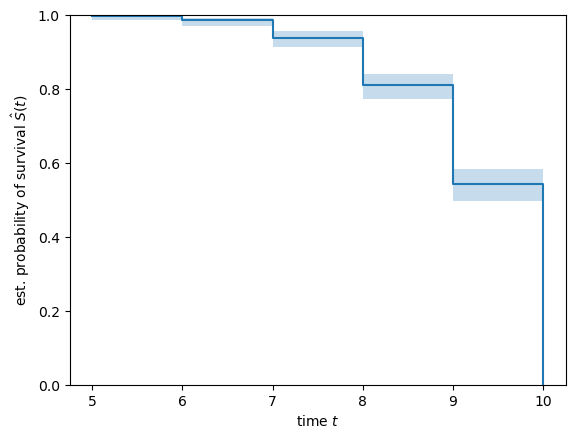

In [15]:
df_last_obs_time_split_subj = df_last_obs_time_split.loc[
    df_last_obs_time_split['g'] == 5,:
]
time, survival_prob, conf_int = kaplan_meier_estimator(
    ~df_last_obs_time_split_subj["event_observed"], df_last_obs_time_split_subj["duration"], conf_type="log-log"
)
plt.step(time, survival_prob, where="post")
plt.fill_between(time, conf_int[0], conf_int[1], alpha=0.25, step="post")
plt.ylim(0, 1)
plt.ylabel(r"est. probability of survival $\hat{S}(t)$")
plt.xlabel("time $t$")

In [16]:
if split == 'test':
    obs_full_traj = ds_test._get_df_Xy_full_traj_obs(g0_as_gres=False)
elif split == 'val':
    obs_full_traj = ds_val._get_df_Xy_full_traj_obs(g0_as_gres=False)
else:
    raise NotImplementedError
obs_trans_time_all_g = get_all_grades_start_end_time(obs_full_traj, gs=[1,2,3,4,5])

In [17]:
max_time = 9

In [18]:
max_gade = obs_trans_time_all_g.loc[obs_trans_time_all_g['event_observed'],'g'].max()

In [19]:
max_gade

3

In [20]:
model_to_metric = []
model_to_prop_t_violated_per_subj = []
model_to_max_violated_per_subj = []
model_to_pred = []
for run_id, pred_fun, descriptor in [
    ('9lpzp2z6',pred_from_SurvSurf,'SurvSurfTaddTG_dydg'),
    ('g7i77adu',pred_from_SurvSurf,'SurvSurfTaddTG_dydg'),
    ('86kuhwqj',pred_from_SurvSurf,'SurvSurfTaddTG_dydg'),
    ('hdq7phrt',pred_from_SurvSurf,'SurvSurfTaddTG_dydg'),
    ('h70e7vd8',pred_from_SurvSurf,'SurvSurfTaddTG_dydg'),
    
    ('adp6kmml',pred_from_DeepHit,'LossSumo'),
    ('tvg0q4aq',pred_from_DeepHit,'LossSumo'),
    ('g7qwxp5i',pred_from_DeepHit,'LossSumo'),
    ('ou4aigle',pred_from_DeepHit,'LossSumo'),
    ('ghv2qdql',pred_from_DeepHit,'LossSumo'),
    
    ('t5py4a71',pred_from_DeepHit,'LossSumo(more g)'),
    ('jn66tz7h',pred_from_DeepHit,'LossSumo(more g)'),
    ('s75yoqxb',pred_from_DeepHit,'LossSumo(more g)'),
    ('f2lp6q6x',pred_from_DeepHit,'LossSumo(more g)'),
    ('upxekmtn',pred_from_DeepHit,'LossSumo(more g)'),
    
    ('w9ldpu3x',pred_from_DeepHit,'LossDyDg'),
    ('v5ujp19h',pred_from_DeepHit,'LossDyDg'),
    ('tlactvtc',pred_from_DeepHit,'LossDyDg'),
    ('sn2izmt0',pred_from_DeepHit,'LossDyDg'),
    ('6by0fixc',pred_from_DeepHit,'LossDyDg'),

    ('cox_time_pycox_10',pred_from_pycox_coxtime, 'standard'),
    ('cox_time_pycox_20',pred_from_pycox_coxtime, 'standard'),
    ('cox_time_pycox_30',pred_from_pycox_coxtime, 'standard'),
    ('cox_time_pycox_40',pred_from_pycox_coxtime, 'standard'),
    ('cox_time_pycox_50',pred_from_pycox_coxtime, 'standard'),
    
    ('Joint_CoxnetSurvivalAnalysis_seed_10',pred_from_sksurv_joint, 'standard'),
    ('Joint_CoxPHSurvivalAnalysis_seed_10',pred_from_sksurv_joint, 'standard'),
    ('xgboost_mono_10',pred_from_xgboost_mono, 'standard'),    
    ('xgboost_mono_more_g_10',pred_from_xgboost_mono, 'standard(more g)'),


    ('Joint_GradientBoostingSurvivalAnalysis_seed_10',pred_from_sksurv_joint, 'standard'),
    # ('Joint_GradientBoostingSurvivalAnalysis_seed_20',pred_from_sksurv_joint, 'standard'),
    # ('Joint_GradientBoostingSurvivalAnalysis_seed_30',pred_from_sksurv_joint, 'standard'),
    # ('Joint_GradientBoostingSurvivalAnalysis_seed_40',pred_from_sksurv_joint, 'standard'),
    # ('Joint_GradientBoostingSurvivalAnalysis_seed_50',pred_from_sksurv_joint, 'standard'),
    
    ('Joint_GradientBoostingSurvivalAnalysis_more_g_seed_10',pred_from_sksurv_joint, 'standard(more g)'),
    # ('Joint_GradientBoostingSurvivalAnalysis_more_g_seed_20',pred_from_sksurv_joint, 'standard(more g)'),
    # ('Joint_GradientBoostingSurvivalAnalysis_more_g_seed_30',pred_from_sksurv_joint, 'standard(more g)'),
    # ('Joint_GradientBoostingSurvivalAnalysis_more_g_seed_40',pred_from_sksurv_joint, 'standard(more g)'),
    # ('Joint_GradientBoostingSurvivalAnalysis_more_g_seed_50',pred_from_sksurv_joint, 'standard(more g)'),

    ('Joint_RandomSurvivalForest_seed_10',pred_from_sksurv_joint, 'standard'),
    ('Joint_RandomSurvivalForest_seed_20',pred_from_sksurv_joint, 'standard'),
    ('Joint_RandomSurvivalForest_seed_30',pred_from_sksurv_joint, 'standard'),
    ('Joint_RandomSurvivalForest_seed_40',pred_from_sksurv_joint, 'standard'),
    ('Joint_RandomSurvivalForest_seed_50',pred_from_sksurv_joint, 'standard'),
  
    ('Joint_RandomSurvivalForest_more_g_seed_10',pred_from_sksurv_joint, 'standard(more g)'),
    ('Joint_RandomSurvivalForest_more_g_seed_20',pred_from_sksurv_joint, 'standard(more g)'),
    ('Joint_RandomSurvivalForest_more_g_seed_30',pred_from_sksurv_joint, 'standard(more g)'),
    ('Joint_RandomSurvivalForest_more_g_seed_40',pred_from_sksurv_joint, 'standard(more g)'),
    ('Joint_RandomSurvivalForest_more_g_seed_50',pred_from_sksurv_joint, 'standard(more g)'),
]:
    out_model, model_name = pred_fun(run_id=run_id, proj_name=proj_name, split=split)
    
    intrg_brier_ipcw_by_subj, mean_auc_ipcw_by_subj = get_brier_and_auc(
        out_model, 
        df_last_obs_time_split, 
        ipcw='by_subj', 
        max_time=max_time, 
        max_grade=max_gade
    )
    intrg_brier_ipcw_by_g, mean_auc_ipcw_by_g = get_brier_and_auc(
        out_model, 
        df_last_obs_time_split, 
        ipcw='by_grade', 
        max_time=max_time,  
        max_grade=max_gade
    )

    intrg_brier_intrvl_imputed_ipcw_by_sbj = get_integrated_brier_intrvl_imputed(
        obs_trans_time_all_g, 
        out_model, 
        df_last_obs_time_split, 
        ipcw='by_subj', 
        max_time=max_time,
        max_grade=max_gade
    )
    intrg_brier_intrvl_imputed = get_integrated_brier_intrvl_imputed(
        obs_trans_time_all_g, 
        out_model, 
        df_last_obs_time_split, 
        ipcw='without_ipcw', 
        max_time=max_time,
        max_grade=max_gade
    )

    intrg_mse_certain_obs_ipcw_by_sbj = get_mse_vs_theory_certain_obs(
        obs_trans_time_all_g, 
        out_model, 
        df_last_obs_time_split, 
        ipcw='by_subj', 
        max_time=max_time,
        max_grade=max_gade
    )
    intrg_mse_certain_obs = get_mse_vs_theory_certain_obs(
        obs_trans_time_all_g, 
        out_model, 
        df_last_obs_time_split, 
        ipcw='without_ipcw',
        max_time=max_time,
        max_grade=max_gade
    )


    model_to_metric.append(
        {
            'run_id':run_id,
            'model_type':model_name,
            'intrg_brier_ipcw_by_subj':intrg_brier_ipcw_by_subj,
            'mean_auc_ipcw_by_subj':mean_auc_ipcw_by_subj,
            'intrg_brier_ipcw_by_g':intrg_brier_ipcw_by_g,
            'mean_auc_ipcw_by_g':mean_auc_ipcw_by_g,
            'intrg_brier_intrvl_imputed_ipcw_by_sbj':intrg_brier_intrvl_imputed_ipcw_by_sbj,
            'intrg_brier_intrvl_imputed':intrg_brier_intrvl_imputed,
            'intrg_mse_certain_obs_ipcw_by_sbj':intrg_mse_certain_obs_ipcw_by_sbj,
            'intrg_mse_certain_obs':intrg_mse_certain_obs,

            'mse':get_mse_vs_theory(out_model, t_max=max_time, g_max=max_gade),
            'mae':get_mae_vs_theory(out_model, t_max=max_time, g_max=max_gade),
            'descriptor':descriptor
        }
    )
    df = out_model['true_prob'].copy()
    df = df.groupby(['g','t']).apply(
        lambda x: np.square(x['pred'] - x['truth']).mean(),
        include_groups=False
    ).reset_index([0,1])
    df['run_id'] = run_id
    df['model_type'] = model_name
    df['descriptor'] = descriptor
    model_to_pred.append(df)

    df = out_model['true_prob'].groupby(['subj','t']).apply(
        lambda x: (x.sort_values('g')['pred'].diff()> 0).any(),
        include_groups=False
    ).rename('any_violation').reset_index()
    df_fract_t_violated_per_subj = df.groupby('subj')['any_violation'].mean().reset_index()

    df = out_model['true_prob'].groupby(['subj','t']).apply(
        lambda x: (x.sort_values('g')['pred'].diff().max()),
        include_groups=False
    ).rename('max_violation').reset_index()
    df_fract_t_violated_per_subj['max_violation'] = df_fract_t_violated_per_subj['subj'].map(
        df.groupby('subj')['max_violation'].max()
    )
    row = df_fract_t_violated_per_subj['any_violation'].describe().to_dict()
    row['model_type'] = model_name
    row['run_id'] = run_id
    row['descriptor'] = descriptor
    model_to_prop_t_violated_per_subj.append(row)


    row = df_fract_t_violated_per_subj.loc[
        df_fract_t_violated_per_subj['any_violation'] > 0,
        'max_violation'
    ].describe().to_dict()
    row['model_type'] = model_name
    row['run_id'] = run_id
    model_to_max_violated_per_subj.append(row)
    print(f'finished processing {run_id}')

df_prop_t_violated_per_subj = pd.DataFrame(model_to_prop_t_violated_per_subj)
df_max_violated_per_subj = pd.DataFrame(model_to_max_violated_per_subj)
df_model_to_metric = pd.DataFrame(model_to_metric)
model_to_pred = pd.concat(model_to_pred)
model_to_pred= model_to_pred.rename(columns={0:'mse'})
del model_to_prop_t_violated_per_subj
del model_to_max_violated_per_subj
del model_to_metric

/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing 9lpzp2z6


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing g7i77adu


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing 86kuhwqj


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing hdq7phrt


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing h70e7vd8


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing adp6kmml


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing tvg0q4aq


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing g7qwxp5i


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing ou4aigle


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing ghv2qdql


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing t5py4a71


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing jn66tz7h


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing s75yoqxb


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing f2lp6q6x


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing upxekmtn


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing w9ldpu3x


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing v5ujp19h


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing tlactvtc


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing sn2izmt0


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:208: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude 

finished processing 6by0fixc


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing cox_time_pycox_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing cox_time_pycox_20


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing cox_time_pycox_30


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing cox_time_pycox_40


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing cox_time_pycox_50


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_CoxnetSurvivalAnalysis_seed_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_CoxPHSurvivalAnalysis_seed_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing xgboost_mono_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing xgboost_mono_more_g_10


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeRegressor from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a f

finished processing Joint_GradientBoostingSurvivalAnalysis_seed_10


/home/yc366/miniconda3/envs/env_survsurf_benchmark/lib/python3.10/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeRegressor from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a f

finished processing Joint_GradientBoostingSurvivalAnalysis_more_g_seed_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_seed_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_seed_20


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_seed_30


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_seed_40


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_seed_50


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_more_g_seed_10


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_more_g_seed_20


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_more_g_seed_30


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_more_g_seed_40


/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat([df, gs_higher_df])
/home/yc366/repos/survsurf_benchmark/model_eval_utils.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude emp

finished processing Joint_RandomSurvivalForest_more_g_seed_50


### Visualize performance

In [21]:
df_mse_by_tg_per_model = model_to_pred.groupby(
    ['model_type','descriptor', 't', 'g']
)['mse'].median().reset_index([0,1,2,3])
df_mse_by_tg_per_model['model_type'].unique()

array(['CoxTime', 'DeepHit', 'Joint_CoxPHSurvivalAnalysis',
       'Joint_CoxnetSurvivalAnalysis',
       'Joint_GradientBoostingSurvivalAnalysis',
       'Joint_RandomSurvivalForest', 'SurvSurf2DTaddTGNormTG',
       'xgboost_mono'], dtype=object)

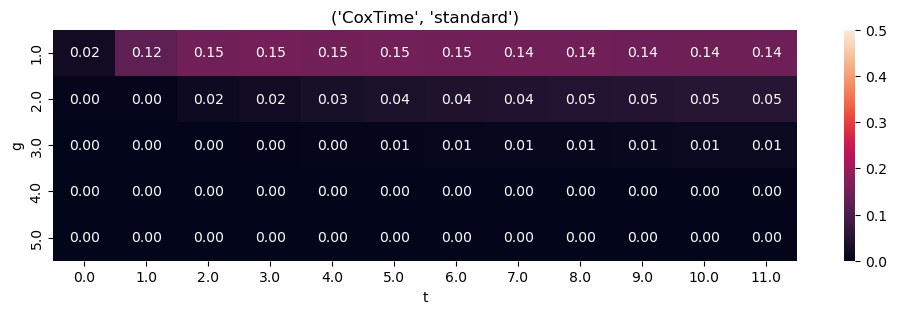

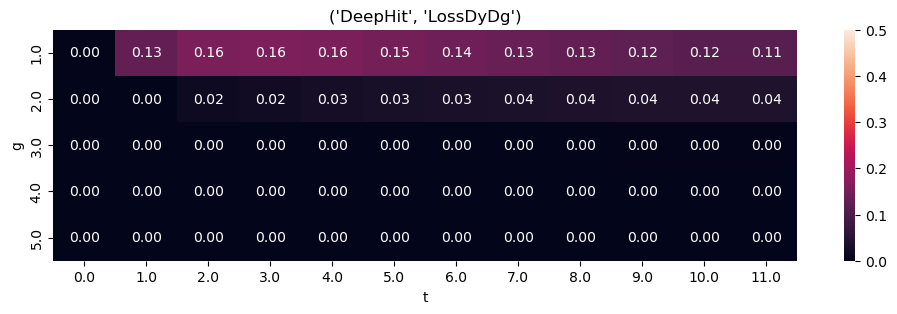

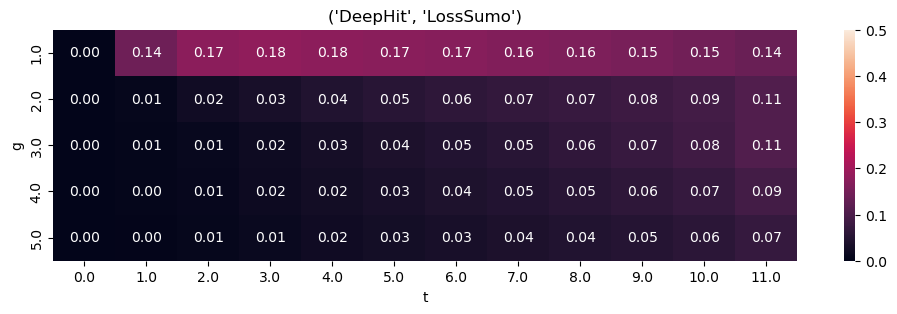

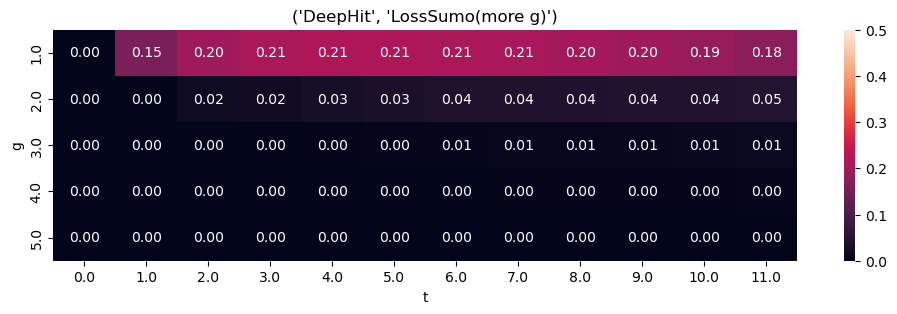

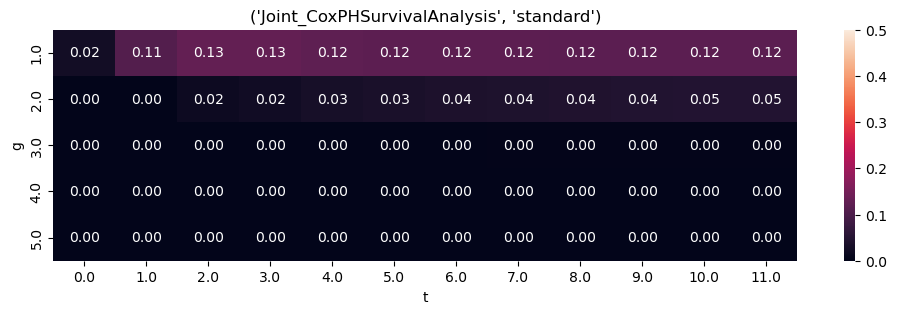

...

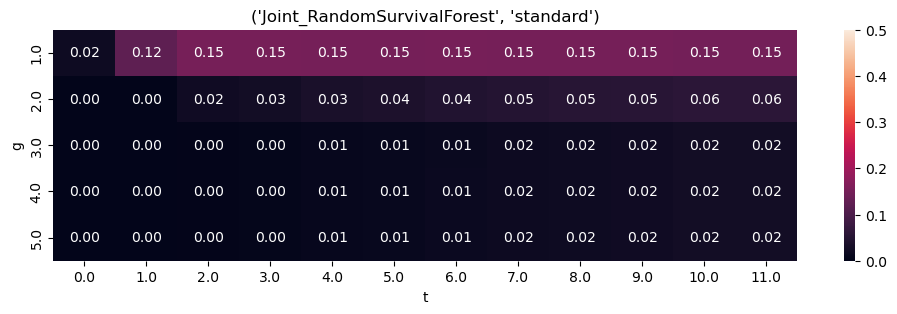

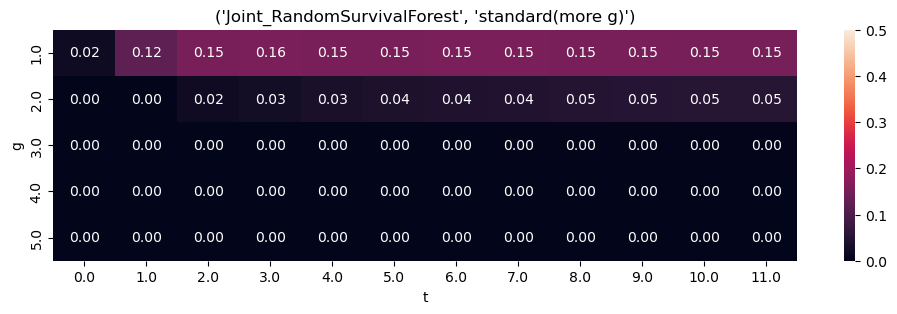

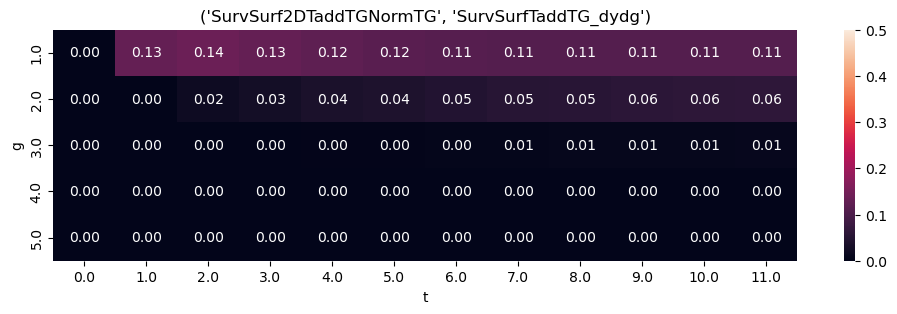

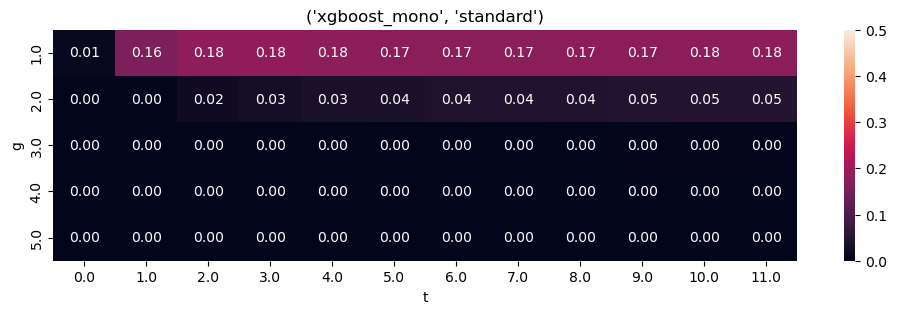

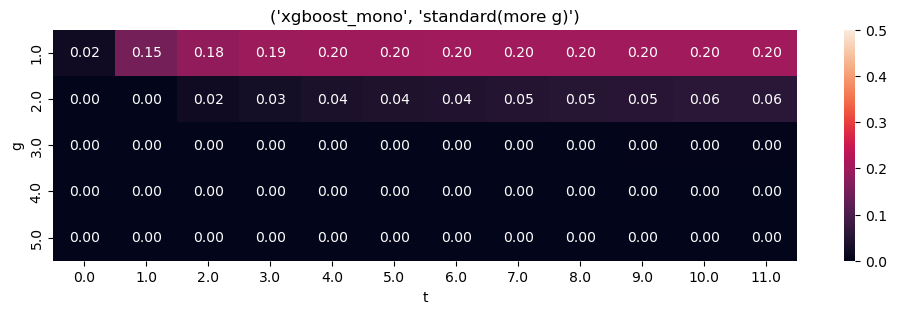

In [22]:
for grp, df in df_mse_by_tg_per_model.groupby(
    ['model_type','descriptor']
):
    df_to_plot = df.pivot(index='g', columns='t', values='mse')
    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    sns.heatmap(df_to_plot, vmin=0, vmax=0.5, ax=ax, annot=True, fmt=".2f")
    plt.title(grp)

In [23]:
df_model_to_metric['median_prop_t_violated'] = df_model_to_metric['run_id'].map(
    df_prop_t_violated_per_subj.set_index('run_id')['50%']
)
df_model_to_metric['median_max_violation'] = df_model_to_metric['run_id'].map(
    df_max_violated_per_subj.set_index('run_id')['50%']
)
df_model_to_metric['max_prop_t_violated'] = df_model_to_metric['run_id'].map(
    df_prop_t_violated_per_subj.set_index('run_id')['max']
)
df_model_to_metric['max_max_violation'] = df_model_to_metric['run_id'].map(
    df_max_violated_per_subj.set_index('run_id')['max']
)

In [24]:
df_model_to_metric.to_csv(f'./output_fig/{ds_name}_df_model_to_metric_ipcw_correct.csv')
df_model_to_metric

,run_id,model_type,intrg_brier_ipcw_by_subj,mean_auc_ipcw_by_subj,intrg_brier_ipcw_by_g,mean_auc_ipcw_by_g,intrg_brier_intrvl_imputed_ipcw_by_sbj,intrg_brier_intrvl_imputed,intrg_mse_certain_obs_ipcw_by_sbj,intrg_mse_certain_obs,mse,mae,descriptor,median_prop_t_violated,median_max_violation,max_prop_t_violated,max_max_violation
0,9lpzp2z6,SurvSurf2DTaddTGNormTG,0.154347,NaN,0.154284,NaN,0.082398,0.081134,0.064958,0.070349,0.068269,0.163098,SurvSurfTaddTG_dydg,0.000000,NaN,0.000000,NaN
1,g7i77adu,SurvSurf2DTaddTGNormTG,0.118778,NaN,0.118727,NaN,0.061384,0.060274,0.045310,0.048916,0.048176,0.126170,SurvSurfTaddTG_dydg,0.000000,NaN,0.000000,NaN
2,86kuhwqj,SurvSurf2DTaddTGNormTG,0.116620,NaN,0.116566,NaN,0.061429,0.060222,0.044895,0.048283,0.047371,0.122641,SurvSurfTaddTG_dydg,0.000000,NaN,0.000000,NaN
3,hdq7phrt,SurvSurf2DTaddTGNormTG,0.117341,NaN,0.117289,NaN,0.060600,0.059467,0.044622,0.048082,0.047550,0.123128,SurvSurfTaddTG_dydg,0.000000,NaN,0.000000,NaN
4,h70e7vd8,SurvSurf2DTaddTGNormTG,0.120352,NaN,0.120302,NaN,0.060615,0.059567,0.044820,0.048370,0.047993,0.120892,SurvSurfTaddTG_dydg,0.000000,NaN,0.000000,NaN
5,adp6kmml,DeepHit,0.159713,NaN,0.159665,NaN,0.093578,0.091761,0.076403,0.081007,0.075562,0.196107,LossSumo,0.000000,NaN,0.000000,NaN
6,tvg0q4aq,DeepHit,0.158917,NaN,0.158869,NaN,0.093161,0.091361,0.075998,0.080594,0.075230,0.194769,LossSumo,0.000000,NaN,0.000000,NaN
7,g7qwxp5i,DeepHit,0.158657,NaN,0.158609,NaN,0.094375,0.092468,0.077144,0.081632,0.075944,0.198413,LossSumo,0.000000,NaN,0.000000,NaN
8,ou4aigle,DeepHit,0.159237,NaN,0.159188,NaN,0.093918,0.092068,0.076728,0.081289,0.075827,0.197198,LossSumo,0.083333,7.364333e-03,0.083333,8.080363e-03
9,ghv2qdql,DeepHit,0.159293,NaN,0.159244,NaN,0.094360,0.092479,0.077067,0.081592,0.075977,0.198368,LossSumo,0.000000,NaN,0.000000,NaN


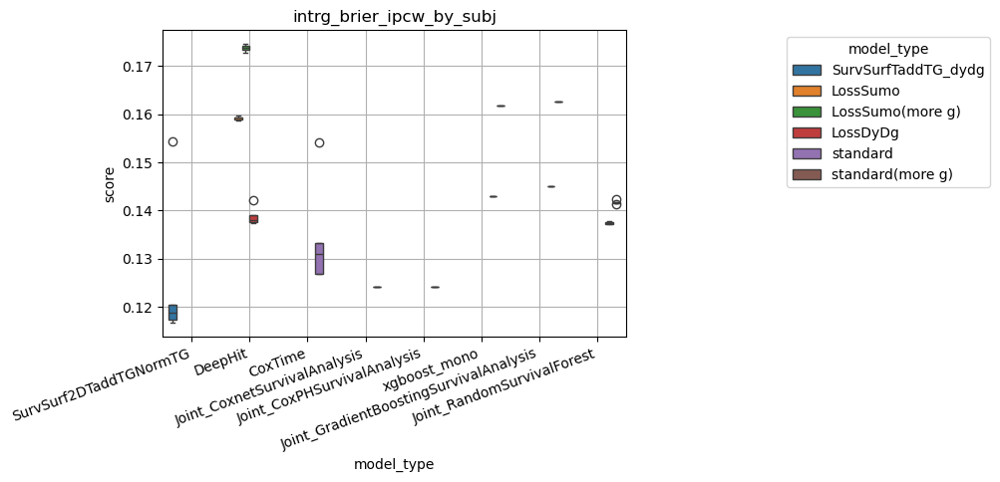

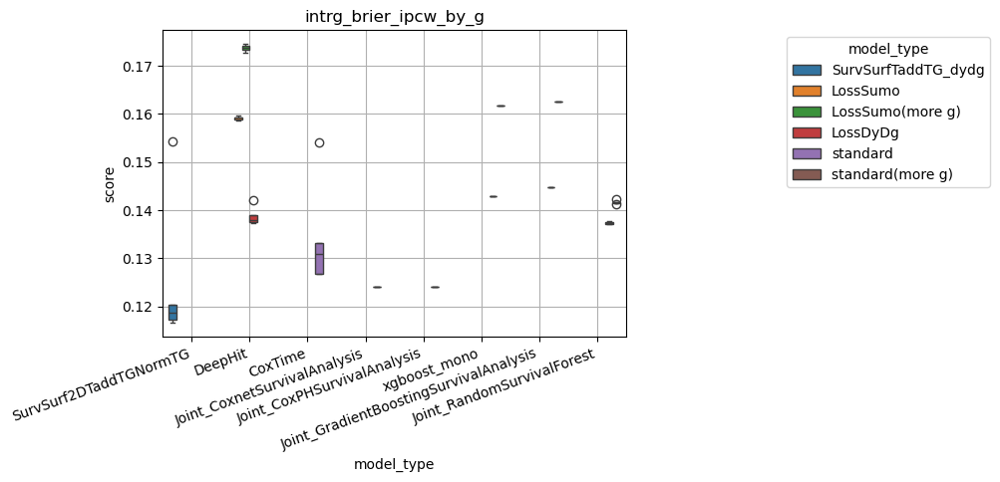

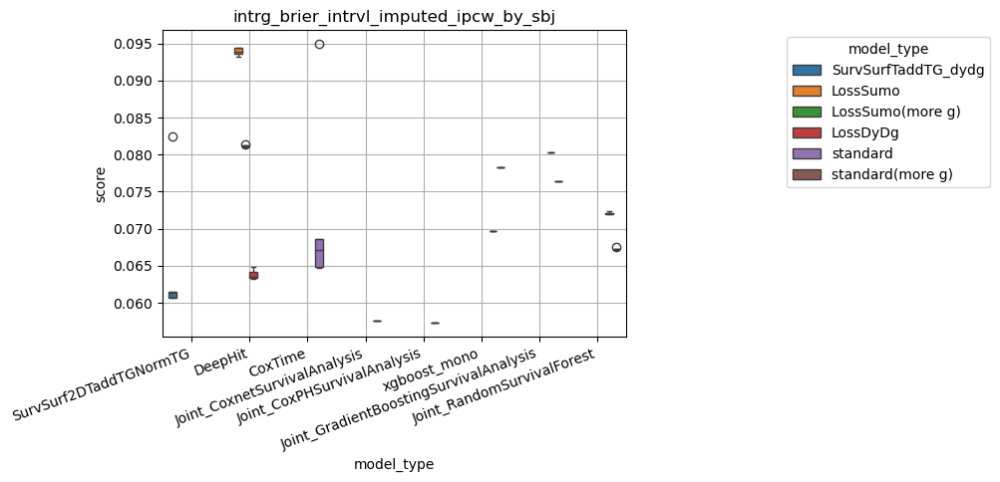

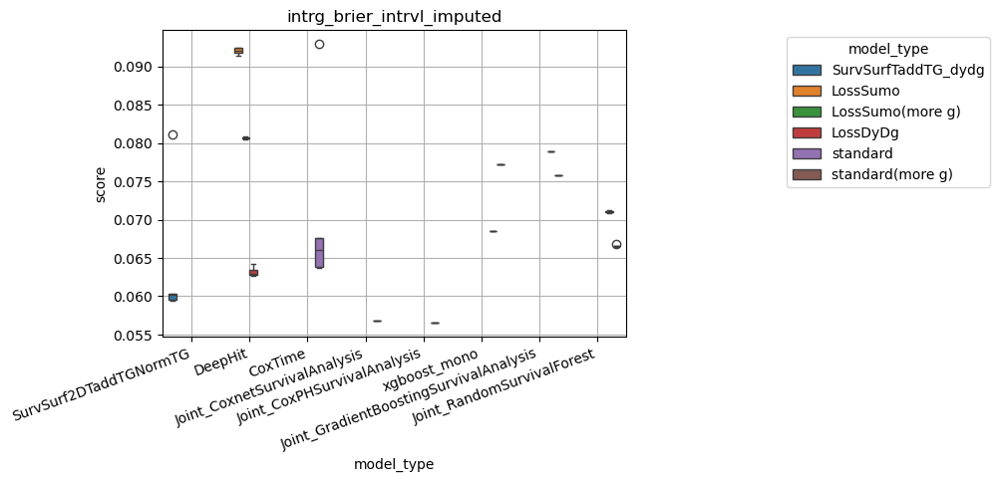

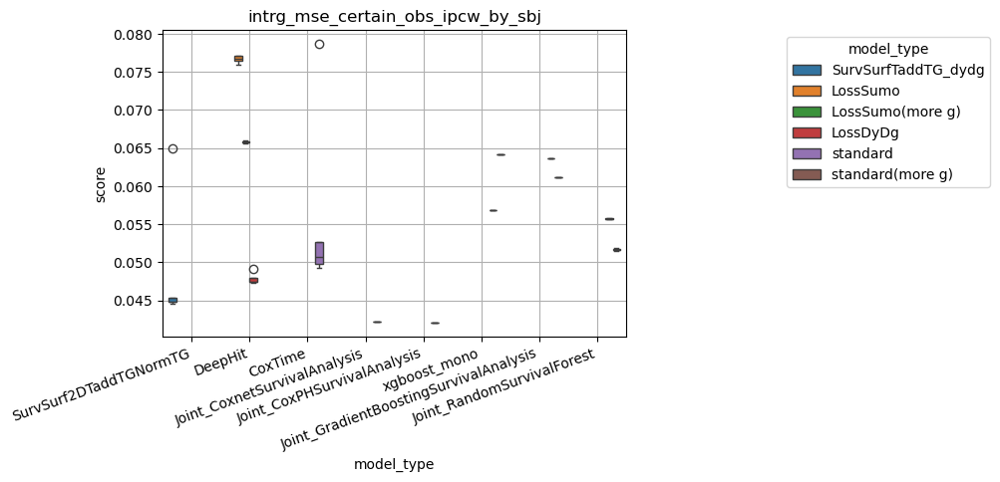

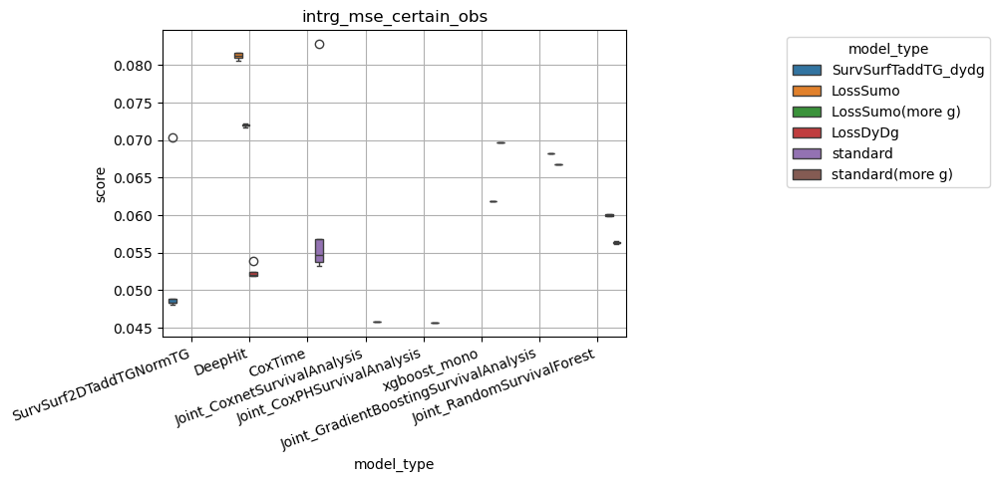

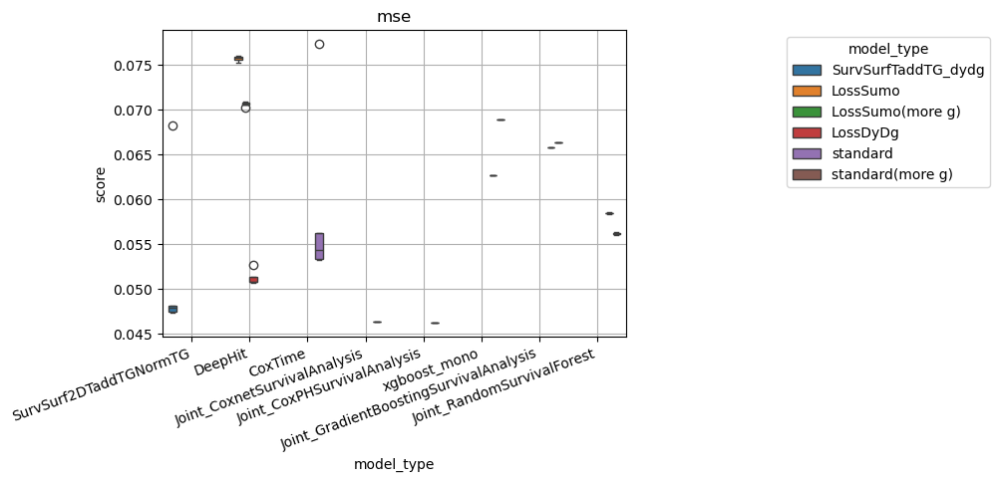

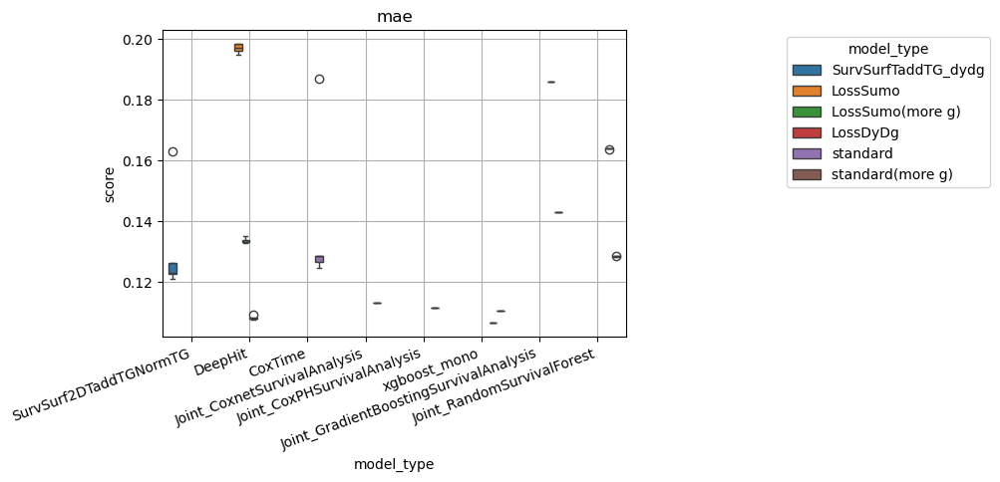

In [25]:
for y in [
    'intrg_brier_ipcw_by_subj',
    'intrg_brier_ipcw_by_g',
    'intrg_brier_intrvl_imputed_ipcw_by_sbj',
    'intrg_brier_intrvl_imputed',
    'intrg_mse_certain_obs_ipcw_by_sbj',
    'intrg_mse_certain_obs',
    'mse',
    'mae'

]:
    fig, ax = plt.subplots(1,1, figsize=(6, 4))
    sns.boxplot(
        data=df_model_to_metric,
        y=y,
        x='model_type',
        hue='descriptor',
        ax=ax,
    )
    ax.legend(bbox_to_anchor=(1.8, 1), title='model_type')
    ax.set(ylabel='score', title=y)
    plt.grid()
    plt.xticks(rotation=20, ha='right')


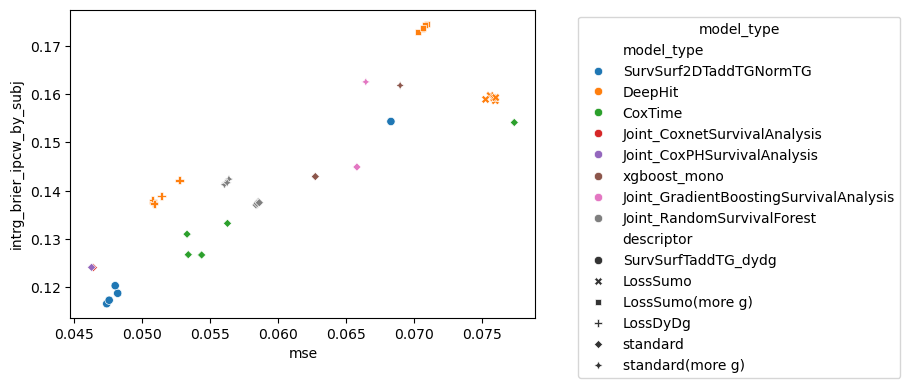

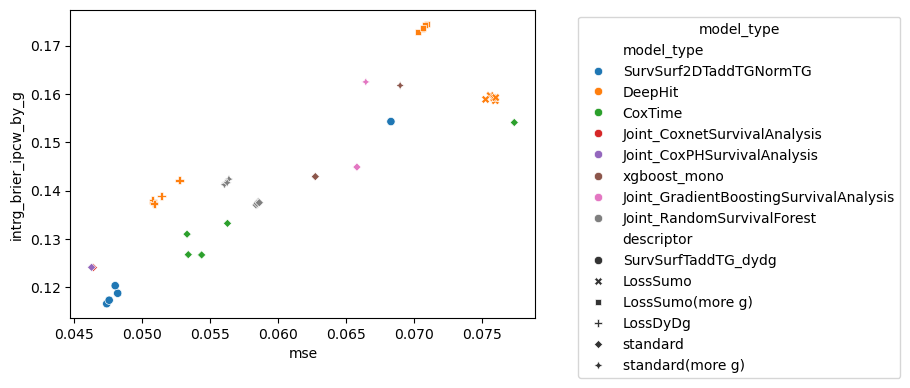

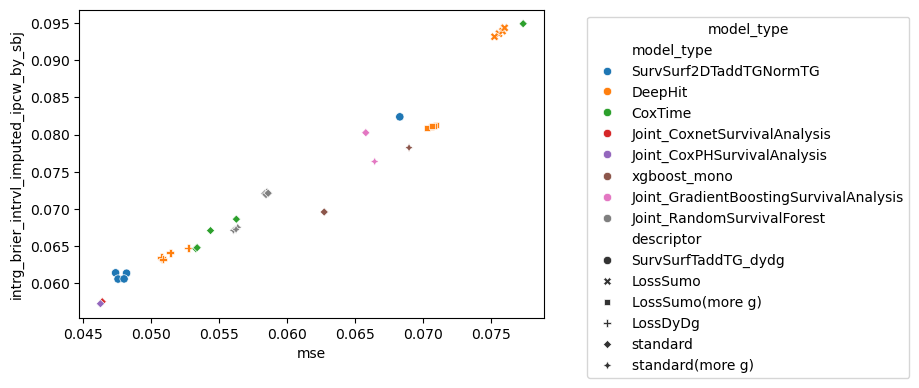

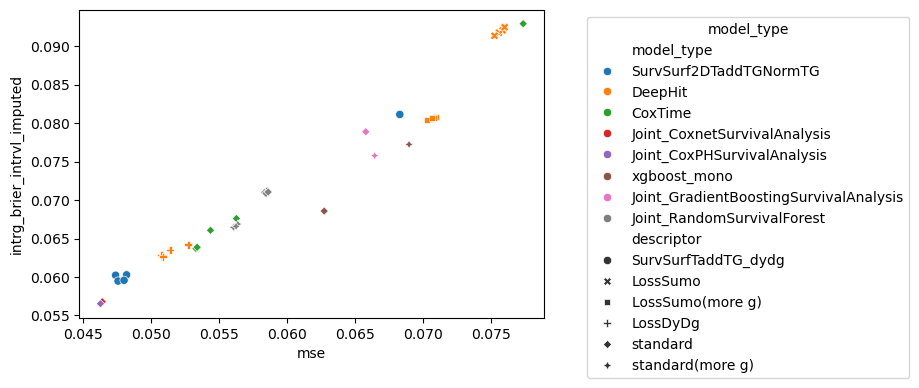

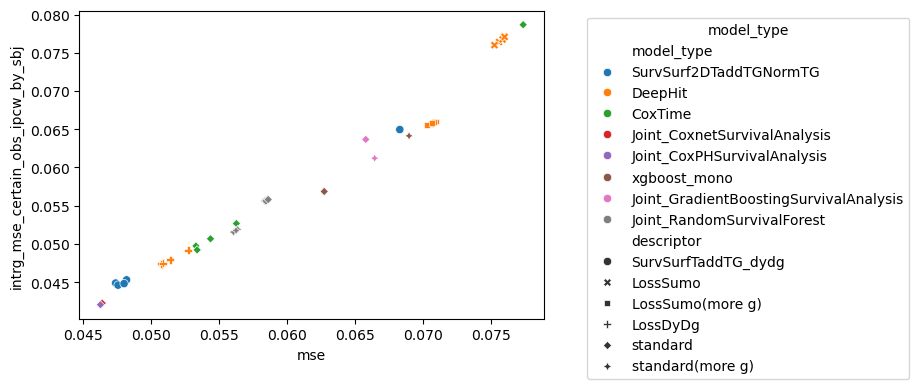

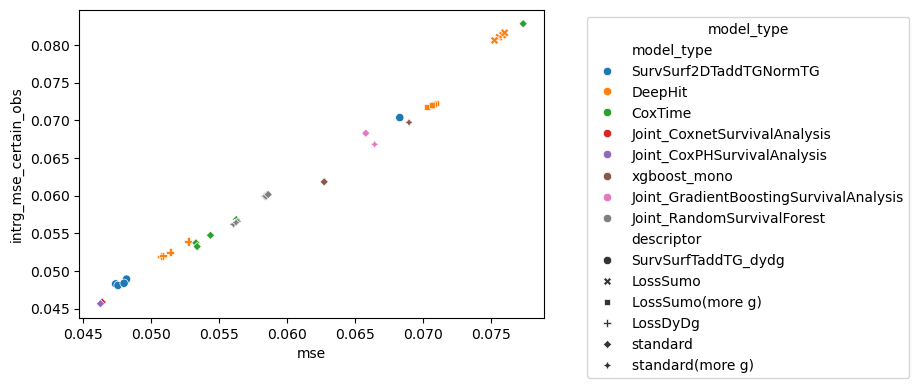

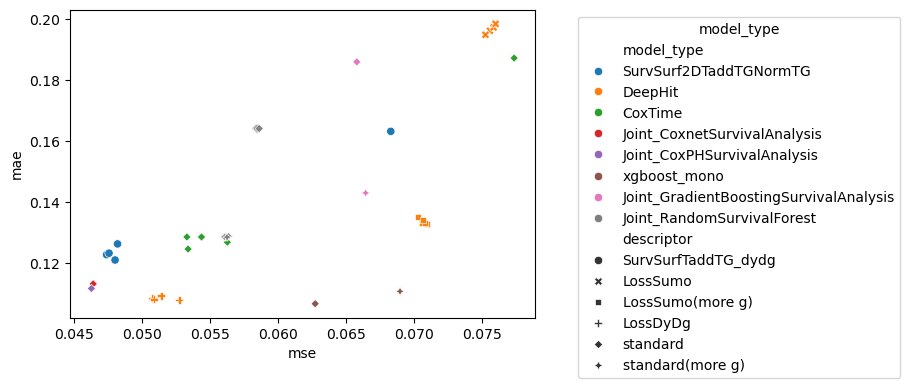

In [26]:
for y in [
    'intrg_brier_ipcw_by_subj',
    'intrg_brier_ipcw_by_g',
    'intrg_brier_intrvl_imputed_ipcw_by_sbj',
    'intrg_brier_intrvl_imputed',
    'intrg_mse_certain_obs_ipcw_by_sbj',
    'intrg_mse_certain_obs',
    'mae'

]:
    fig, ax = plt.subplots(1,1, figsize=(6, 4))
    sns.scatterplot(
        data=df_model_to_metric,
        x='mse',
        y=y,
        hue='model_type',
        style='descriptor',
        ax=ax,
    )
    ax.legend(bbox_to_anchor=(1.8, 1), title='model_type')

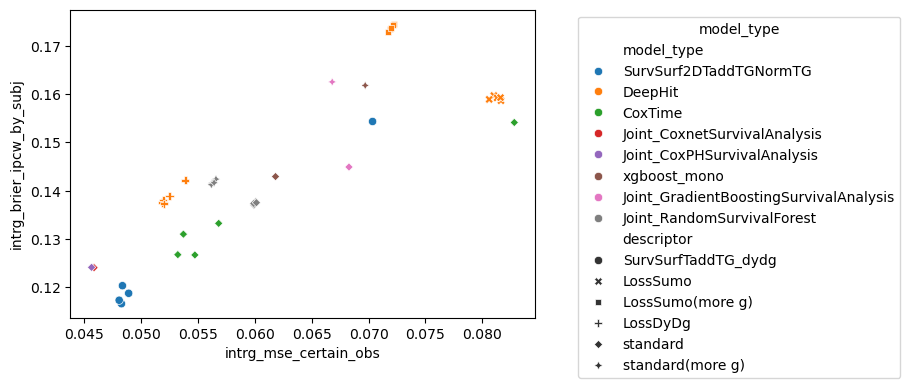

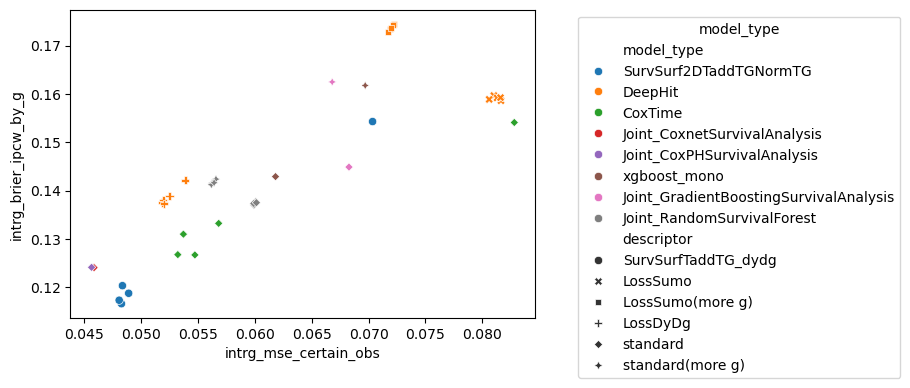

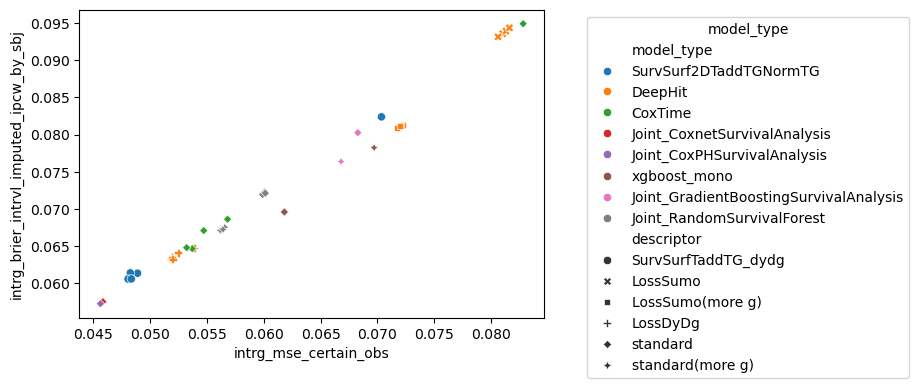

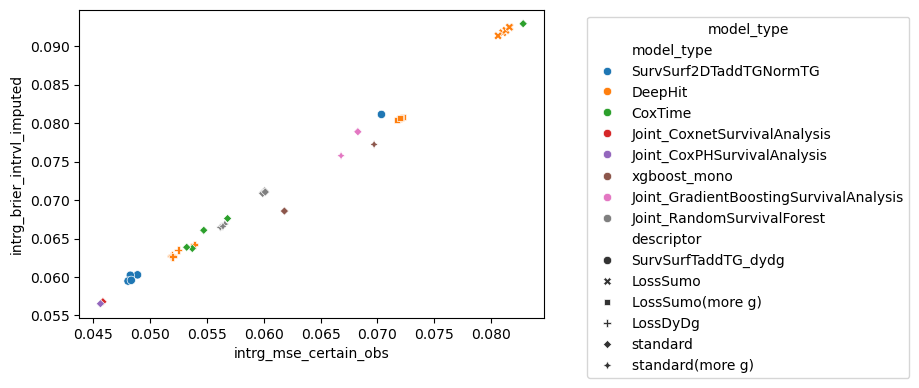

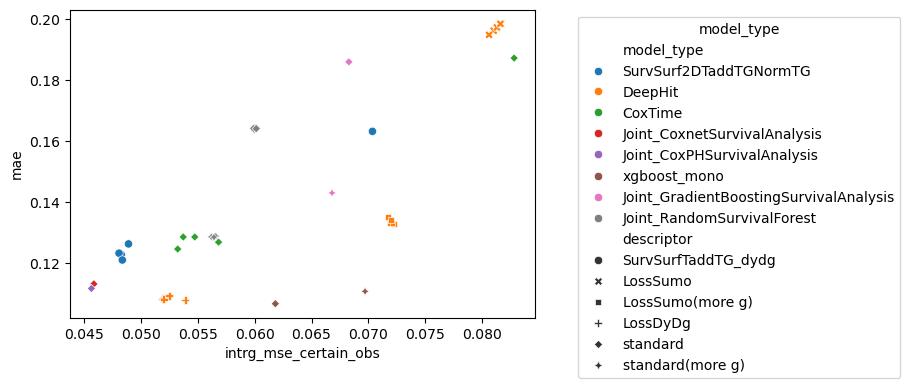

In [27]:
for y in [
    'intrg_brier_ipcw_by_subj',
    'intrg_brier_ipcw_by_g',
    'intrg_brier_intrvl_imputed_ipcw_by_sbj',
    'intrg_brier_intrvl_imputed',
    'mae'

]:
    fig, ax = plt.subplots(1,1, figsize=(6, 4))
    sns.scatterplot(
        data=df_model_to_metric,
        x='intrg_mse_certain_obs',
        y=y,
        hue='model_type',
        style='descriptor',
        ax=ax,
    )
    ax.legend(bbox_to_anchor=(1.8, 1), title='model_type')

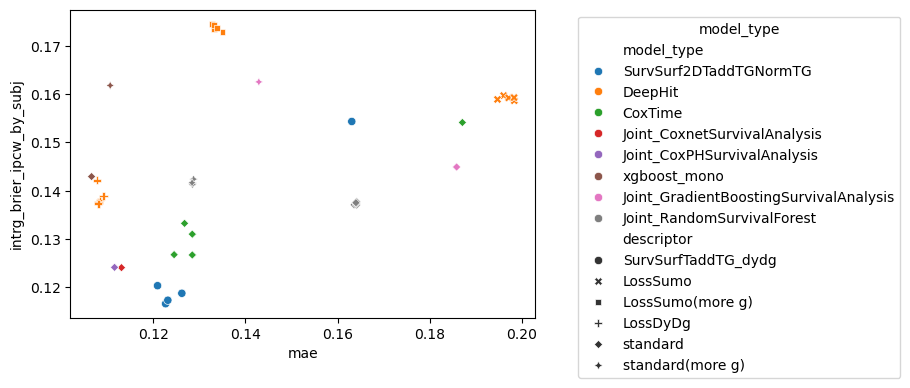

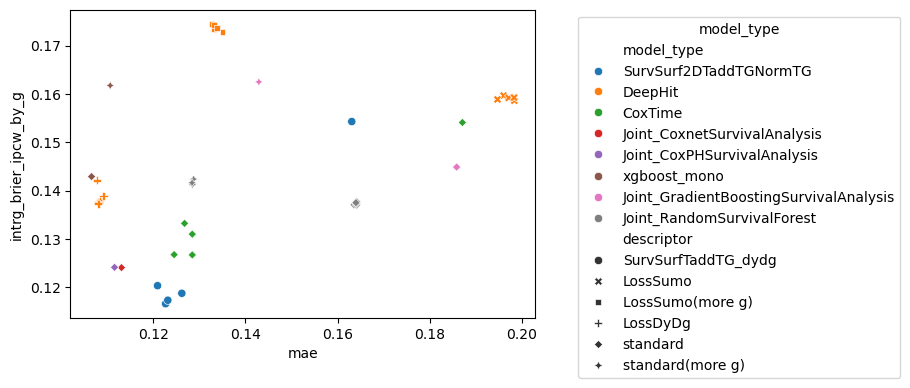

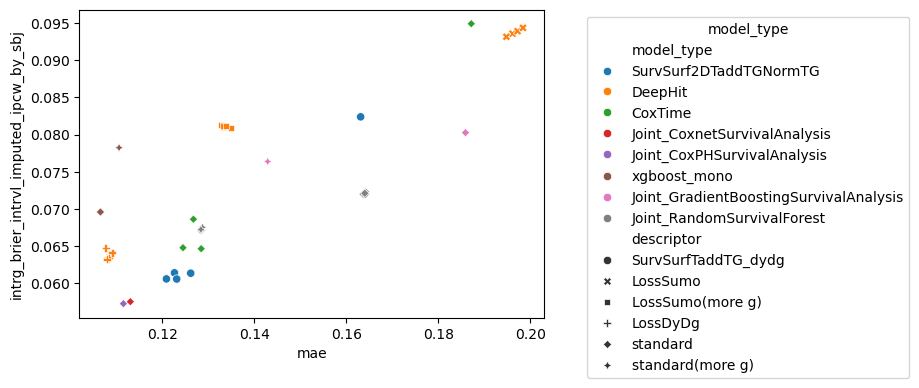

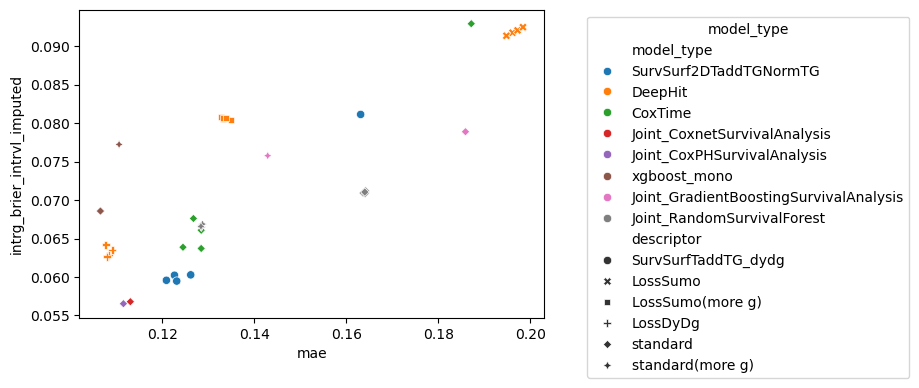

In [28]:
for y in [
    'intrg_brier_ipcw_by_subj',
    'intrg_brier_ipcw_by_g',
    'intrg_brier_intrvl_imputed_ipcw_by_sbj',
    'intrg_brier_intrvl_imputed',
]:
    fig, ax = plt.subplots(1,1, figsize=(6, 4))
    sns.scatterplot(
        data=df_model_to_metric,
        x='mae',
        y=y,
        hue='model_type',
        style='descriptor',
        ax=ax,
    )
    ax.legend(bbox_to_anchor=(1.8, 1), title='model_type')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, '(Joint_CoxPHSurvivalAnalysis, standard)'),
  Text(1, 0, '(Joint_CoxnetSurvivalAnalysis, standard)'),
  Text(2, 0, '(DeepHit, LossDyDg)'),
  Text(3, 0, '(SurvSurf2DTaddTGNormTG, SurvSurfTaddTG_dydg)'),
  Text(4, 0, '(Joint_RandomSurvivalForest, standard(more g))'),
  Text(5, 0, '(Joint_RandomSurvivalForest, standard)'),
  Text(6, 0, '(CoxTime, standard)'),
  Text(7, 0, '(xgboost_mono, standard)'),
  Text(8, 0, '(Joint_GradientBoostingSurvivalAnalysis, standard)'),
  Text(9, 0, '(Joint_GradientBoostingSurvivalAnalysis, standard(more g))'),
  Text(10, 0, '(xgboost_mono, standard(more g))'),
  Text(11, 0, '(DeepHit, LossSumo(more g))'),
  Text(12, 0, '(DeepHit, LossSumo)')])

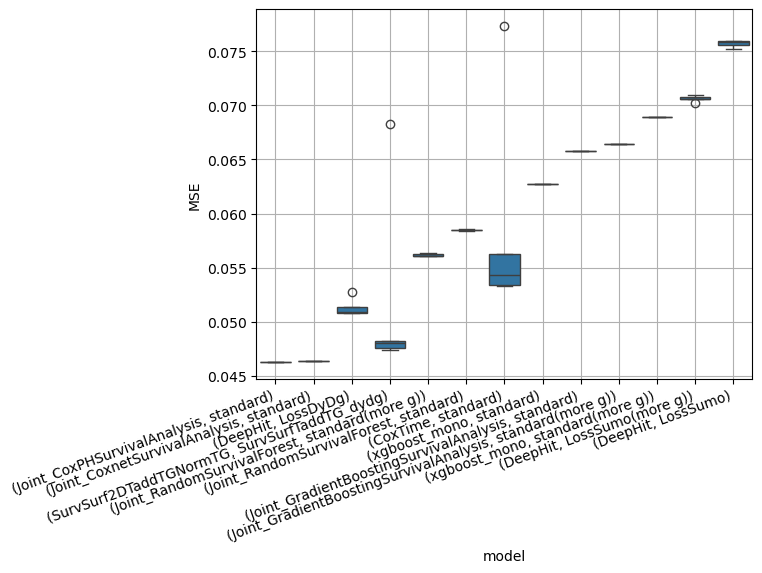

In [29]:
fig, ax = plt.subplots(1,1)
df = df_model_to_metric.copy()
df['max_max_violation'] = df['max_max_violation'].fillna(0)
df = df.sort_values(['model_type','descriptor'])
df['model'] = '(' + df['model_type'] + ', ' + df['descriptor'] + ')'

df['mean_mse'] = df['model'].map(df.groupby('model')['mse'].mean().to_dict())
df = df.sort_values('mean_mse')
sns.boxplot(
    data=df,
    x='model',
    y='mse',
    ax=ax,
)

ax.set(ylabel='MSE')
plt.grid()
plt.xticks(rotation=20, ha='right')

In [30]:
df_model_to_metric.groupby(['model_type', 'descriptor'])['mse'].describe()

count      mean  \
model_type                             descriptor                             
CoxTime                                standard               5.0  0.058916   
DeepHit                                LossDyDg               5.0  0.051298   
                                       LossSumo               5.0  0.075708   
                                       LossSumo(more g)       5.0  0.070636   
Joint_CoxPHSurvivalAnalysis            standard               1.0  0.046255   
Joint_CoxnetSurvivalAnalysis           standard               1.0  0.046386   
Joint_GradientBoostingSurvivalAnalysis standard               1.0  0.065767   
                                       standard(more g)       1.0  0.066419   
Joint_RandomSurvivalForest             standard               5.0  0.058463   
                                       standard(more g)       5.0  0.056165   
SurvSurf2DTaddTGNormTG                 SurvSurfTaddTG_dydg    5.0  0.051872   
xgboost_mono                           standard               1.0  0.062709   
                                       standard(more g)       1.0  0.068948   

                                                                 std  \
model_type                             descriptor                      
CoxTime                                standard             0.010368   
DeepHit                                LossDyDg             0.000833   
                                       LossSumo             0.000313   
                                       LossSumo(more g)     0.000256   
Joint_CoxPHSurvivalAnalysis            standard                  NaN   
Joint_CoxnetSurvivalAnalysis           standard                  NaN   
Joint_GradientBoostingSurvivalAnalysis standard                  NaN   
                                       standard(more g)          NaN   
Joint_RandomSurvivalForest             standard             0.000091   
                                       standard(more g)     0.000128   
SurvSurf2DTaddTGNormTG                 SurvSurfTaddTG_dydg  0.009172   
xgboost_mono                           standard                  NaN   
                                       standard(more g)          NaN   

                                                                 min  \
model_type                             descriptor                      
CoxTime                                standard             0.053276   
DeepHit                                LossDyDg             0.050757   
                                       LossSumo             0.075230   
                                       LossSumo(more g)     0.070246   
Joint_CoxPHSurvivalAnalysis            standard             0.046255   
Joint_CoxnetSurvivalAnalysis           standard             0.046386   
Joint_GradientBoostingSurvivalAnalysis standard             0.065767   
                                       standard(more g)     0.066419   
Joint_RandomSurvivalForest             standard             0.058347   
                                       standard(more g)     0.056029   
SurvSurf2DTaddTGNormTG                 SurvSurfTaddTG_dydg  0.047371   
xgboost_mono                           standard             0.062709   
                                       standard(more g)     0.068948   

                                                                 25%  \
model_type                             descriptor                      
CoxTime                                standard             0.053366   
DeepHit                                LossDyDg             0.050775   
                                       LossSumo             0.075562   
                                       LossSumo(more g)     0.070589   
Joint_CoxPHSurvivalAnalysis            standard             0.046255   
Joint_CoxnetSurvivalAnalysis           standard             0.046386   
Joint_GradientBoostingSurvivalAnalysis standard             0.065767   
                                       standard(more g)     0.06

# Clean up

In [31]:
with torch.no_grad():
    torch.cuda.empty_cache()
gc.collect()

109684